# Описание

Классификация изображений на основе векторизации c использованием SIFT

## Зависимости

In [70]:
# %load ./src/imports/basic_imports.py
import os
import pandas as pd
import numpy as np


In [71]:
# %load ./src/imports/matplotlib.py

import matplotlib.pyplot as plt


In [72]:
# %load ./src/imports/CV2_imports.py

! pip install opencv-contrib-python

import cv2 as cv2


Defaulting to user installation because normal site-packages is not writeable


In [73]:
# %load ./src/imports/tqdm_imports.py

! pip install ftfy regex tqdm
from tqdm import tqdm
tqdm.pandas()


Defaulting to user installation because normal site-packages is not writeable


In [74]:
# %load ./src/imports/multiprocessing_imports.py

from multiprocessing import Pool


In [75]:
# %load ./src/imports/random_imports.py

from random import sample, randint


In [76]:
# %load ./src/imports/Counter_imports.py

from collections import Counter


In [77]:
# %load ./src/imports/sklearn.py

! pip install -U scikit-learn

from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import normalize, StandardScaler


Defaulting to user installation because normal site-packages is not writeable


In [78]:
# %load ./src/imports/DBSCAN.py

from sklearn.cluster import DBSCAN


In [79]:
# %load ./src/imports/NearestNeighbors.py

from sklearn.neighbors import NearestNeighbors


In [80]:
# %load ./src/imports/KneeLocator.py

from kneed import KneeLocator


In [81]:
# %load ./src/imports/KMeans.py

from sklearn.cluster import KMeans


In [82]:
# %load ./src/imports/silhouette.py

from sklearn.metrics import silhouette_samples, silhouette_score


In [83]:
# %load ./src/imports/sklearn_metrics.py

from sklearn import metrics


In [84]:
# %load ./src/imports/PCA.py

from sklearn.decomposition import PCA


## Параметры

In [85]:
# определяем колонку по которой будем связывать все таблицы
global_key = 'regNumber'

# путь к папке к изображениями из ГК
img_data_url = './data/img_for_clasifire/V__270523/'

In [86]:
# ссылки 
url_dict = {
    'clear_data_list':'./out/gk_out/clear_data_list.csv',    
    'plot_list':'./out/gk_out/plot_list.csv',  
    'sample_objects':'./out/gk_out/sample_objects.csv',
    }

### Вспомогательные функции

In [87]:
# %load ./src/functions/to_pool.py

# для многоканальной обработки списка любой функцией

# item_list - список элементов
# method - функция-обработчик
def to_pool(item_list, method):
    with Pool(processes=os.cpu_count()) as pool:
         rezult_list = []
         for res in tqdm(pool.imap(method, (i for i in item_list)),
                     total = len(item_list)):
             rezult_list.append(res)
    return rezult_list

def to_tqdm(item_list, method):
  rezult_list = []
  for res in tqdm(map(method, (i for i in item_list)),
                     total = len(item_list)):
             rezult_list.append(res)
  return rezult_list


In [88]:
# %load ./src/functions/show_img.py

# вывод изображений

# image_list - список словарей вида {'img':вектор изображения в формате PIL или CV2,'title':название}
# name - булиан - выводить или нет заголовок изображения
# col - количество колонок 
# cv2_img - булиан - передается картинка в формате CV2
# suptitle - общий заголовок
def show_img(image_list, name = True, col = 5, cv2_img = False, suptitle='', title_key = global_key):
    row = len(image_list) // col + 1

    plt.figure(figsize=(6.4, 2.4*row))
    for i in range(0,len(image_list)):
        plt.subplot(row, col, i + 1)
        plt.suptitle(suptitle)
        plt.axis('off')
        if name:
           title = str(image_list[i][title_key])
        else:
           title =  'N' + str(i+1) 
        plt.title(f"{title}") 
        if cv2_img:
           plt.imshow(cv2.cvtColor(image_list[i]['img'], cv2.COLOR_BGR2RGB))
        else:
           plt.imshow(image_list[i]['img'])


In [89]:
# %load ./src/functions/get_file_list.py

# считать список файлов из всех поддерикторий
# возвращает список имен файлов и уникальные расширения файлов

# path - путь к директории type - str
# name_list - список названий файлов по которому фильтруем type - list
def get_file_list(path, name_list = []):
    rezult = []
    variant = set()
    for root, dirs, files in os.walk(path, topdown = False):        
        for name in files:
            if len(name_list) > 0:
               if not(filter_fille_name(name, name_list)):
                  continue
            
            rezult.append(os.path.join(root, name))
            # если нет расширений у файлов добавляем None, иначе - название расширения
            file_extension = name.split('.')[1] if len(name.split('.')) > 1 else None
            variant.add(file_extension) 
    return rezult, variant


In [90]:
# %load ./src/functions/filter_fille_name.py

# на вход передается путь к имени файла и список id объектов. id соответствует первой части имени файла
# по маске id_*.jpg
# возвращает булево значение есть id в списке или нет

# fille_path - полный путь к файлу
# id_list - список id
def filter_fille_name(fille_path, id_list):   
    fille_name = fille_path.split('/')[-1]
    return fille_name.split('.')[0].split('_')[0] in id_list


In [91]:
# %load ./src/functions/file2cv2.py

# конвертация в формат cv2
# возвращает словарь вида {'img':вектор изображения в формате CV2,'title':название}

# filename - полный путь к файлу
def file2cv2(filename):     
     return {'img':cv2.imread(filename), 'title':filename}


In [92]:
# %load ./src/functions/csv2DF.py

# загрузка файлов по словарю
# name - имя
# link_dir - словарь
# sep = "," - разделитель
def csv2DF(name, link_dir = url_dict, sep = ","):
    url = link_dir[name]
    df = pd.read_csv(url, encoding = 'utf8', sep = sep )
    return df


### Функции

In [93]:
# %load ./src/functions/getImgId.py

# возвращает id объекта из пути к файлу картинки и преффикс 1 или 2

# fille_path - путь к файлу
def setImgId(fille_path):  
  fille_name = fille_path.split('/')[-1]
  return fille_name.split('.')[0].split('_')[0], fille_name.split('.')[0].split('_')[1]  

# возвращает id объекта из пути к файлу картинки
# fille_path - путь к файлу
def getImgId(fille_path):    
  return int(setImgId(fille_path)[0])

# возвращает преффикс 1 или 2 объекта из пути к файлу картинки

# fille_path - путь к файлу
def filterImgPreff(fille_path, pref_list = [1, '1']):  
    fille_pref = setImgId(fille_path)[1]
    return fille_pref in pref_list


In [94]:
# %load ./src/functions/setTrueLabel.py

# возвращает метку кластера для переданного изображения

# line - словарь вида {'img': изображение формата PIA/CV2, 'title':путь к файлу, 'regNumber':id по которому матчатся таблицы}
# loc_key = '' - название столбца по которому соединяются таблицы (если не указан - 'regNumber')
def setTrueLabel(line, loc_key = ''):
  key = loc_key if loc_key else global_key
  img_id = int(line[key])
  return valid_table_df.loc[valid_table_df[key] == img_id]['label_true'].tolist()[0]


In [95]:
# %load ./src/functions/setPlotImg.py
# соединяет таблицу изображений и таблицу сюжетов по ключевому полю

# df_plot - датафрейм с сюжетами, df_img - датафрейм с изображениями
# loc_key = '' - название столбца по которому соединяются таблицы (если не указан - 'regNumber')
def setPlotImg(df_plot, df_img, loc_key = ''):
  key = loc_key if loc_key else global_key
  key_plot_list = np.unique(df_plot[key].tolist())
  df_temp = df_img.loc[df_img[key].isin(key_plot_list)]
 
  return df_plot.merge(df_temp, on=key)


## Загрузка результатов выгрузки данных из ГК

Для дальнейшей работы используются результаты выгрузки данных ГК.
Файлы изображений должны именоваться по следующему шаблону:
regNumber_postfics.jpg, где

regNumber - регестрационный номер в ГК, это id служит для связи между изображением и предметом
postfics - число 1, 2 или 3, где 1 - обозначает основное изображение в карточке объекта в ГК, 2, 3 - остальные

In [96]:
# загрузка изображений 
# img_list - список изображений
# type_set - список расширений загруженных файлов для проверки результатов
img_list, type_set = get_file_list(img_data_url)
type_set

{'jpg'}

In [97]:
image_list_cv2 = to_pool(img_list, eval('file2cv2'))

100%|██████████████████████████████████████| 1733/1733 [00:11<00:00, 147.19it/s]


In [98]:
# вариант с тем, чтобы убрать вторые изображения
image_list_cv2 = list(filter(lambda item: filterImgPreff(item['title'], [1, '1']), image_list_cv2))
print(len(image_list_cv2))

1677


In [99]:
# для дальнейшего удобства конвертируем их в dataframe
data_img_cv2 =  pd.DataFrame(image_list_cv2)

In [100]:
# добавляем колонку с id по которому матчим таблицы
image_num_list_cv2 = to_pool(data_img_cv2['title'].tolist(), eval('getImgId'))
data_img_cv2[global_key] = image_num_list_cv2

100%|████████████████████████████████████| 1677/1677 [00:00<00:00, 28733.86it/s]


In [101]:
# создаем список id ролевантных изображений
table_df = csv2DF('clear_data_list')
clear_id_list = table_df[global_key].tolist()

In [102]:
# создаем список сюжето
plot_table_df = csv2DF('plot_list')
plot_table_df =  plot_table_df[[global_key, 'name']]

In [103]:
# создаем словарь сюжетов
plot_list = np.unique(plot_table_df['name'].tolist())

plot_dictionary = {plot_list[i]:str(i) for i in range(0, len(plot_list))}
# добавляем номер сюжета по словарю
plot_table_df['plot_id'] = plot_table_df['name'].map(plot_dictionary)
# У нас совпадают ID картинок для двух сюжетов
# В каталоге это лист с несколькими гравюрами https://goskatalog.ru/portal/#/collections?id=34450495
plot_table_df[plot_table_df[global_key] == 34251283]

,regNumber,name,plot_id
43,34251283,Старый Зимний дом,87
44,34251283,Новый зимний дом с Невы,61


In [104]:
# Выкидываю из списка пока оба сюжета
plot_table_df = plot_table_df.loc[~plot_table_df[global_key].isin([34251283])]

In [105]:
plot_table_df.head()

,regNumber,name,plot_id
0,15811002,Вид Удинского острога,33
1,24220418,Вид Бронницкой горы близ Новгорода,3
2,10111826,Вид Томска,29
3,16053815,Вид Чебоксары,34
4,25141913,Вид Якутска,36


In [106]:
print(f'Всего сюжетов {len(plot_table_df)}')

Всего сюжетов 95


In [107]:
# валидационная выборка
valid_table_df = csv2DF('sample_objects')
# убираем из валидационной выборки connectedness = 0 и plot = NaN
values_list = [0.0]
valid_table_df = valid_table_df[~valid_table_df['connectedness'].isin(values_list)]
valid_table_df = valid_table_df[valid_table_df['plot'].notna()]
valid_table_df = valid_table_df[['id', 'name' ,'regNumber','plot']]

# добавляем номер сюжета по словарю
valid_table_df['label_true'] = valid_table_df['plot'].map(plot_dictionary)

# пока до решения вопроса удаляем афишу выставки Русские гравюры 18 века по рисункам Михаила Махаева
valid_table_df = valid_table_df[valid_table_df['label_true'].notna()]
valid_id_list = valid_table_df[global_key].tolist()
plots_in_valid_table_df = np.unique(valid_table_df['label_true'].tolist())

In [108]:
valid_table_df.head()

,id,name,regNumber,plot,label_true
0,608f1729172e287c2d0f3271,План Петербурга 1753 г.,28868848,План Петербурга 1753,70
1,62c207343bacb4653d14de46,Петергоф. Петергоф. Большой дворец.,36495048,Большой дворец. Петергоф,1
2,6407acab0e567613411c9436,Вид устья реки Фонтанки от Грота и Запасного д...,41222311,Грот. Летний сад по реке Фонтанке,50
3,637d3ff1584941407ffc683c,Вид Невской перспективы от Фонтанки к Адмиралт...,39473044,Проспект палат против Аничковских ворот и Невс...,83
4,6227c7b2cff1801b8a9b1254,Вид Кремля из-за Замоскворечья. 2-я серия. Лис...,34257000,Вид Кремля из-за Замоскворечья,14


In [109]:
# Распределение сюжетов, представленных в выборке
plots_in_valid_table_dict = dict(Counter(valid_table_df['plot']))
# сюжеты, для которых в выборке больше 2 объектов
common_plots_in_valid_table = dict(filter(lambda x: x[1] >= 2, plots_in_valid_table_dict.items()))

In [110]:
print(f'Всего сюжетов: {len(plot_table_df)}')
print(f'Количество сюжетов, представленных в выборке: {len(plots_in_valid_table_df)}')
print(f'Количество сюжетов, представленных в выборке для которых количество объектов больше или = 2:{len(common_plots_in_valid_table)}')

Всего сюжетов: 95
Количество сюжетов, представленных в выборке: 70
Количество сюжетов, представленных в выборке для которых количество объектов больше или = 2:40


In [111]:
lemit = 10
print(f'{lemit} самых распространенных сюжета:')
print(*list(dict(sorted(plots_in_valid_table_dict.items(), key=lambda item: item[1], reverse=True)).items())[0:lemit], sep = '\n')

10 самых распространенных сюжета:
('План Петербурга 1753', 21)
('Проспект вниз по Неве реке между Зимним домом и Академией Наук', 19)
('Проспект Государственных коллегий', 10)
('Главное Адмиралтейство', 10)
('Проспект вверх по Неве реке от Адмиралтейства и Академии Наук к востоку.', 10)
('Эрмитаж. Екатерининский парк', 9)
('Грот. Летний сад по реке Фонтанке', 8)
('Воскресенские ворота. Китайгородская стена', 8)
('Проспект вниз по реке Неве от Невского моста между Исаакиевской церковью и кадетским корпусом', 8)
('Охотничий павильон Монбижу в Зверинце. Екатерининский парк. Царскок село. ', 8)


## Обработка картинок

In [112]:
# %load ./src/functions/get_gray.py

# конвертация из BGR в gray

# img - вектор изображенияв формат cv2

def get_gray(img):
   img = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
   return cv2.cvtColor(img,cv2.COLOR_BGR2GRAY) 


In [113]:
# %load ./src/functions/get_sorted_kp.py

# сортировка ключевых точек

#kp - массив ключевых точек, полученных из SIFT

def get_sorted_kp(kp):
    return sorted(kp, key = lambda x: x.response, reverse= True)


In [114]:
# %load ./src/functions/get_sift_kp.py

# получение ключевых точек sift
# возвращает массив ключевых точек и ч/б изображение в формате вектора CV2

#img - вектор изображения формата CV2
def get_sift_kp(img, sift = cv2.SIFT_create()):    
    gray = get_gray(img) 
    kp_all = sift.detect(gray,None)
    kp = get_sorted_kp(kp_all)

    return kp, gray


In [115]:
# %load ./src/functions/set_sift_dict.py

# получение ключевых точек
# возвращает словарь вида 
# {'img':вектор изображения формата CV2, 'gray':вектор ч/б изображения формата CV2, 'title':название изображения, 'kp':массив ключевых точек}

#img_info - словарь вида {'img':вектор изображения формата CV2, 'title':название изображения}
def set_sift_dict(img_info):
    name_list = ['img','gray','title','kp']
    img, title = img_info['img'], img_info['title']
    kp, gray = get_sift_kp(img)
    img_dict = dict(zip(name_list,[img, gray, title, kp]))
    
    return img_dict


In [116]:
# %load ./src/functions/get_sift_des.py

# получение массива deskriptors ключевых точек
# возвращает массив deskriptors

#img_info - словарь вида 
# {'gray':вектор ч/б изображения формата CV2, 'kp':массив ключевых точек}
def get_sift_des(img_info, sift = cv2.SIFT_create()):  
  gray, kp = img_info['gray'], img_info['kp']
  return sift.compute(gray,kp)[1]


In [117]:
# %load ./src/functions/set_sift_des.py

# создает словарь deskriptors, переданных изображений
# возвращает список deskriptors переданных изображений

# sift_dict - словарь вида 
# {'img':вектор изображения формата CV2, 'gray':вектор ч/б изображения формата CV2, 'title':название изображения, 'kp':массив ключевых точек}
def set_sift_des(sift_dict):  
  gray = pd.DataFrame(sift_dict)['gray'].tolist()
  # находим минимальное количество ключевых точек для всех изображений
  len_kp_list = [len(item['kp']) for item in sift_dict]
  lemit = min(set(len_kp_list)) 
  # Оставляем лучшие точки
  kp_list = [item['kp'][:lemit] for item in sift_dict]  
  kp_dict = pd.DataFrame({'gray': gray, 'kp': kp_list}).to_dict(orient='records')
  
  des_list = to_tqdm(kp_dict, eval('get_sift_des'))

  return des_list


In [118]:
sift_dict = to_tqdm(image_list_cv2, eval('set_sift_dict'))
sift_deskript = set_sift_des(sift_dict)

100%|███████████████████████████████████████| 1677/1677 [01:45<00:00, 15.88it/s]


In [119]:
sift_deskript_reshape = [t.reshape(-1) for t in sift_deskript]

In [120]:
data_img_cv2['features'] = sift_deskript_reshape

In [121]:
# создаем список ключевых изображений
data_key_img_cv2 = setPlotImg(plot_table_df, data_img_cv2)

In [122]:
data_img_cv2_valid = data_img_cv2.loc[data_img_cv2[global_key].isin(valid_id_list)]
data_img_cv2 = data_img_cv2.loc[~data_img_cv2[global_key].isin(valid_id_list)]
# отделяем "чистую выборку" (без conntents=0)
data_img_cv2_clear = data_img_cv2.loc[data_img_cv2[global_key].isin(clear_id_list)]

In [123]:
print(f'Длина валидационной выборки: {len(data_img_cv2_valid)}. Длина общей выборки: {len(data_img_cv2)}. Длина очищенной выборки: {len(data_img_cv2_clear)}')

Длина валидационной выборки: 253. Длина общей выборки: 1424. Длина очищенной выборки: 1091


In [124]:
data_key_img_cv2.head()

,regNumber,name,plot_id,img,title,features
0,15811002,Вид Удинского острога,33,"[[[192, 226, 226], [196, 230, 230], [197, 231,...",./data/img_for_clasifire/V__270523/images_all_...,"[3.0, 1.0, 0.0, 9.0, 64.0, 7.0, 1.0, 2.0, 73.0..."
1,24220418,Вид Бронницкой горы близ Новгорода,3,"[[[194, 197, 201], [193, 196, 200], [193, 196,...",./data/img_for_clasifire/V__270523/images_all_...,"[14.0, 3.0, 1.0, 8.0, 26.0, 26.0, 10.0, 19.0, ..."
2,10111826,Вид Томска,29,"[[[186, 220, 220], [184, 218, 218], [190, 224,...",./data/img_for_clasifire/V__270523/images_all_...,"[0.0, 0.0, 4.0, 9.0, 2.0, 1.0, 4.0, 3.0, 1.0, ..."
3,16053815,Вид Чебоксары,34,"[[[96, 151, 178], [94, 149, 176], [84, 141, 16...",./data/img_for_clasifire/V__270523/images_all_...,"[3.0, 5.0, 11.0, 6.0, 44.0, 73.0, 10.0, 2.0, 3..."
4,25141913,Вид Якутска,36,"[[[215, 220, 229], [215, 220, 229], [215, 220,...",./data/img_for_clasifire/V__270523/images_all_...,"[78.0, 41.0, 5.0, 6.0, 1.0, 0.0, 0.0, 2.0, 119..."


In [125]:
# для трейна прописываем label
label_true_cv2 = to_pool(data_img_cv2_valid.to_dict(orient='records'), eval('setTrueLabel'))
data_img_cv2_valid['label_true'] = label_true_cv2
data_img_cv2_valid.head()

100%|████████████████████████████████████████| 253/253 [00:00<00:00, 637.02it/s]


,img,title,regNumber,features,label_true
7,"[[[255, 255, 254], [255, 255, 254], [255, 255,...",./data/img_for_clasifire/V__270523/images_all_...,31085826,"[1.0, 1.0, 13.0, 34.0, 66.0, 8.0, 1.0, 1.0, 61...",85
8,"[[[50, 55, 53], [53, 58, 56], [57, 62, 60], [5...",./data/img_for_clasifire/V__270523/images_all_...,28869117,"[2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 1.0, ...",80
25,"[[[98, 108, 118], [97, 107, 117], [98, 110, 12...",./data/img_for_clasifire/V__270523/images_all_...,17152545,"[2.0, 5.0, 49.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",31
41,"[[[255, 255, 254], [255, 255, 254], [255, 255,...",./data/img_for_clasifire/V__270523/images_all_...,33808656,"[52.0, 101.0, 19.0, 1.0, 1.0, 1.0, 1.0, 13.0, ...",58
44,"[[[167, 197, 208], [168, 198, 209], [172, 198,...",./data/img_for_clasifire/V__270523/images_all_...,19469087,"[0.0, 9.0, 61.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",47


In [126]:
train_sift = data_img_cv2_valid['features'].tolist()
probs_sift =  data_img_cv2['features'].tolist()
probs_sift_clear = data_img_cv2_clear['features'].tolist()
labels_sift_true = data_img_cv2_valid['label_true'].tolist()

## DBSCAN

In [127]:
global_score_funcs = [
    #("V-measure", metrics.v_measure_score),
    ("Rand index", metrics.rand_score),
    ("ARI", metrics.adjusted_rand_score),
    #("MI", metrics.mutual_info_score),
    #("NMI", metrics.normalized_mutual_info_score),
    ("AMI", metrics.adjusted_mutual_info_score),
    ("Однородность, Полнота, V-мера", metrics.homogeneity_completeness_v_measure)    
]

In [128]:
# %load ./src/functions/get_dbscan_label_test.py

# применяет DBSCAN с переданными параметрами
# возвращает список полученных лейблов

# X - список фичей,
# eps=0.1, min_samples=4, metric='cosine' - параметры DBSCAN,
# (подробней https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html#sklearn.cluster.DBSCAN)
# scale  -   булево значение стандартизировать или нет перед применение DBSCAN
def get_dbscan_label_test(X, eps=0.1, min_samples=4, metric='cosine', scale = True, norm = True):
    db = DBSCAN(eps=eps, min_samples=min_samples, metric=metric)
    if scale:
       scaler = StandardScaler()
       X = scaler.fit_transform(X)
    if norm:
       X = normalize(X)
    db.fit(X)
    return db.labels_


In [129]:
# %load ./src/functions/print_сlustering_param.py

# выводит на печать результаты кластаризации DBSCAN

# labels - список полученных лейблов
def print_сlustering_param(labels):
  n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
  n_noise_ = list(labels).count(-1)
  print(f'Количество кластеров : {n_clusters_}. Количество шума: {n_noise_} ')


In [130]:
# %load ./src/functions/print_claster_count.py

# выводит на печать словарь вида {кластер:количество элементов в нем}

# labels - список лейблов
def print_claster_count(labels):
    print(dict(Counter(labels)))


In [131]:
# %load ./src/functions/print_claster.py

# выводит на экран изображения принадлежащие к конкретному кластеру

# df - датафрейм с столбцами 'img' (вектор изображения PIL или CV2), 'title' (заголовок), 'labels' (присвоенный класс)
# label - наименование класса,
# sampel_size = 30 - максимальный размер выборки изображений,
# suptitle = '' - заголовок для печати блока изображений,
# cv2_img = False - булеан использовать формат cv2 или нет, 
# name = False -  булеан печатать имя картинки или нет, 
def print_claster(df, label, sampel_size = 30, suptitle = '', cv2_img = False, name = False):
  rezult_df = df[df['labels'] == label].to_dict(orient='records')
  if len(rezult_df) > sampel_size:
     show_img(sample(rezult_df, sampel_size), name = name, suptitle = suptitle, cv2_img = cv2_img)
  else:
     show_img(rezult_df, name = name, suptitle = suptitle, cv2_img = cv2_img)


In [132]:
# %load ./src/functions/print_img_in_classters.py

# выводит на печать изображения по всем кластерам
# df - датафрейм с столбцами 'img' (вектор изображения PIL или CV2), 'title' (заголовок), 'labels' (присвоенный класс)
# sampel_size = 30 - максимальный размер выборки изображений,
# cv2_img = False - булеан использовать формат cv2 или нет, 
# name = False -  булеан печатать имя картинки или нет, 
def print_img_in_classters(df, cv2_img = False, sampel_size = 30, suptitle = '', name = False):    
    for k in np.unique(df['labels']):
        df_temp = df[df['labels'] == k]
        suptitle = '-'.join([str(k), str(len(df_temp))])
        print_claster(df, k, suptitle = suptitle, sampel_size = sampel_size, cv2_img = cv2_img , name = name)


In [133]:
# %load ./src/functions/printVizual.py

# выводит на печать картинки из переданного списка, согласно кластаризации
# или печатает только один класс, если есть ключ кластера

# img_df - дата фрейм с колонками 'img' - типа PIC/CV, 'title' - имя картинки = ссылка на картинку в выгрузке 
# labels - список лейблов
# key - ключ кластера
# printOneClaster = False, - печатаем все или только выбранный кластер
# sampel_size = 30, suptitle = '', cv2_img = False, name = False - параметры печати
def printVizual(img_df, labels, key=False, printOneClaster = False, sampel_size = 30, suptitle = '', cv2_img = False, name = False):
    df_temp = pd.DataFrame({'img': img_df['img'], 'title': img_df['title'], 'labels':labels})
    if printOneClaster:
       print_claster(df_temp, key, sampel_size = sampel_size, suptitle = suptitle, cv2_img = cv2_img, name =name)
    else:
       print_img_in_classters(df_temp, sampel_size = sampel_size, suptitle = suptitle, cv2_img = cv2_img, name =name)


### Подбор параметров

In [134]:
# %load ./src/functions/getMetricsRezult.py

# возвращает результаты проверки кластеризации различными метриками

# x- предсказанные метки, y - истинные метки
# score_funcs_list - список кортежей формата (название_функции, функция)

def getMetricsRezult(x, y, score_funcs_list):
    rezult_list = []
    for func in score_funcs_list:
        score_func = func[1]
        score_name = func[0]
        rezult = score_func(y, x)
        rezult_list.append({'score_name': score_name, 'score':rezult})
    return rezult_list
        
        


In [135]:
# %load ./src/functions/print_kneeLocatore.py

# метод для нахождения оптимального eps для DBSCAN,
# используется для дальнейшего построения графика "колена"
# возвращает средние дистанции между точками набора, полученные методом NearestNeighbors

# X - список фичей,
# num = 21 -  параметр earestNeighbors, количество соседей = MinPts, которое будет использоваться в DBSCAN,
# print_plt = False - булево значение печать график или нет
# scale  -   булево значение стандартизировать или нет перед применение NearestNeighbors
# norm  -   булево значение нормализовать или нет перед применение NearestNeighbors
def get_neighbors(X, num = 21, print_plt = False, scale = True, norm = True):
  neigh = NearestNeighbors(n_neighbors=num)
  if scale:
       scaler = StandardScaler()
       X = scaler.fit_transform(X)
  if norm:
       X = normalize(X)
  nbrs = neigh.fit(X)
  distances, indices = nbrs.kneighbors(X)
  distances = np.sort(distances[:,num-1], axis=0)
  if print_plt:
     fig = plt.figure(figsize = (18, 9))
     plt.plot(distances)
     plt.xlabel('Points')
     plt.ylabel('Distance')

  return distances


# возвращает значенеи "колена"

# dist - дистанции между соседями, полученные методом NearestNeighbors
# print_plt = False - булево значение печать график или нет
def get_kneeLocatore(dist, print_plt = False):
    x, y = np.arange(len(dist)), dist
    kneedle = KneeLocator(x, y, S=1.0, curve="convex", direction="increasing")
    if print_plt:
       kneedle.plot_knee_normalized()
    
    knee_point = kneedle.knee
    elbow_point = kneedle.elbow
    return knee_point, elbow_point


In [136]:
# %load ./src/functions/print_dbscan_test.py

# печатает результаты кластерезации методом DBSCAN с различными параметрами

# X - список фичей,
# param_list - список словарей вида {'eps':значение eps, 'min_samples':минимальный размер кластера}
# getScore = False - печатать оценку кластеризации
# Y='' - список классов для валидации
# score_funcs_list = '' - список кортежей формата (название_функции, функция) (по умолчанию global_score_funcs)
def print_dbscan_test(X, param_list, getScore = False, Y='', score_funcs_list = ''):
    for row in param_list:
       min_samples = row['min_samples']
       eps = row['eps']
       labels =  get_dbscan_label_test(X, eps=eps, min_samples=min_samples)
       
       n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
       n_noise_ = list(labels).count(-1)
       print(f'eps={eps}, min_samples={min_samples}')
       print(f'Количество кластеров : {n_clusters_}. Количество шума: {n_noise_} ')
       print(print_claster_count(labels))
       if getScore:
          score_funcs_list = score_funcs_list if score_funcs_list else global_score_funcs
          score_list = getMetricsRezult(labels, Y, score_funcs_list)
          print(*score_list, sep='\n')
       print('+'*100)


In [137]:
# %load ./src/functions/get_dbscan_test.py

#  результаты кластерезации методом DBSCAN с различными параметрами
# возвращает лист словарей вида {'eps':значение eps, 'min_samples':минимальный размер кластера, 'n_clusters_':количество кластеров, 'n_noise_':количество шума}
# отсортированный по возрастанию шума

# X - список фичей,
# param_list - список словарей вида {'eps':значение eps, 'min_samples':минимальный размер кластера}
# min_claster_count = 2 - минимальное количество кластеров, которое должно получится в выборке
# getScore = False - печатать оценку кластеризации
# Y='' - список классов для валидации
# score_funcs_list = '' - список кортежей формата (название_функции, функция) (по умолчанию global_score_funcs)

def get_dbscan_test(X, param_list, min_claster_count = 2, getScore = False, Y='', score_funcs_list = ''):
    rezult = []
    for row in param_list:
       min_samples = row['min_samples']
       eps = row['eps']
       labels =  get_dbscan_label_test(X, eps=eps, min_samples=min_samples)       
       n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
       n_noise_ = list(labels).count(-1)
       if getScore:
          score_funcs_list = score_funcs_list if score_funcs_list else global_score_funcs
          rezult.append({'eps':eps, 'min_samples':min_samples, 'n_clusters_':n_clusters_, 'n_noise_':n_noise_, 'score_list':getMetricsRezult(labels, Y, score_funcs_list)})
       else:
          rezult.append({'eps':eps, 'min_samples':min_samples, 'n_clusters_':n_clusters_, 'n_noise_':n_noise_})

    rezult = list(filter(lambda item: item['n_clusters_'] > min_claster_count, rezult))
    rezult = sorted(rezult, key=lambda item: item['n_noise_'])
    
    return rezult


In [138]:
# %load ./src/functions/set_dbscan_param.py

# создает список параметров и проводит для них тестирование DBSCAN
# в зависимости от флага выводит на печать результаты 
# возвращает лист словарей вида {'eps':значение eps, 'min_samples':минимальный размер кластера, 'n_clusters_':количество кластеров, 'n_noise_':количество шума}
# отсортированный по возрастанию шума

# X - список фичей,
# eps_list - список eps для которых будет формироваться лист параметров
# samples_list = [3, 4] - список min_samples для которых будет формироваться лист параметров
# print=False - булево значение печатать результаты тестов 
# getScore = False - печатать оценку кластеризации
# Y='' - список классов для валидации
# score_funcs_list = '' - список кортежей формата (название_функции, функция) (по умолчанию global_score_funcs)
def set_dbscan_param(X, eps_list, samples_list = [3, 4], print=False, getScore = False, Y=''):
    min_samples_list = []
    for i in samples_list:
        min_samples_list = min_samples_list + len(eps_list) * [i]
    param_list = pd.DataFrame(list(zip(eps_list*len(samples_list), min_samples_list)),columns =['eps', 'min_samples']).to_dict(orient='records')
    if print:
       print_dbscan_test(X, param_list, getScore = getScore, Y=Y)
    else:
       return get_dbscan_test(X, param_list, getScore = getScore, Y=Y)


In [139]:
def rezult_DF_DBSCAN(klaster_list):
    rezult_list = []
    
    for item in klaster_list:
        row_dict = {
            'title':item['title'],
            'data':item['data_type'],
            'min_samples':item['min_samples'],
            'eps':item['eps'],
        }     
        count = dict(Counter(item['labels']))
        n_noise_ = list(item['labels']).count(-1)
        row_dict.update({'class':len(count), 'counter':count, 'noise':n_noise_})
        
                        
        rezult_list.append(row_dict)      
    
    return pd.DataFrame(rezult_list)

In [140]:
best_eps_sift = 0.928
best_sample_sift = 2

labels_1_sift = get_dbscan_label_test(train_sift, eps=best_eps_sift, min_samples=best_sample_sift)
print_сlustering_param(labels_1_sift)
print_claster_count(labels_1_sift)
getMetricsRezult(labels_1_sift, labels_sift_true, global_score_funcs)

Количество кластеров : 8. Количество шума: 129 
{0: 104, -1: 129, 1: 2, 2: 8, 3: 2, 4: 2, 5: 2, 6: 2, 7: 2}


[{'score_name': 'Rand index', 'score': 0.5689190037016124},
 {'score_name': 'ARI', 'score': 0.0019714361563188156},
 {'score_name': 'AMI', 'score': 0.031103279513256844},
 {'score_name': 'Однородность, Полнота, V-мера',
  'score': (0.11971702052707422, 0.43683633233252905, 0.18793074876333601)}]

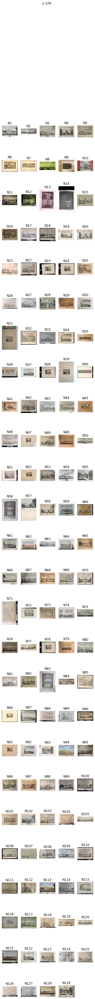

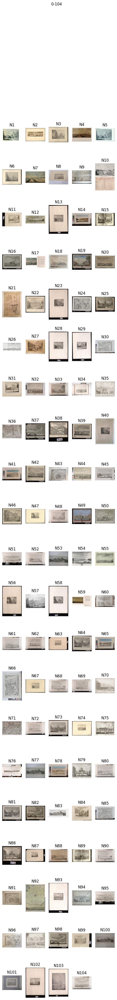

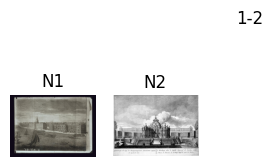

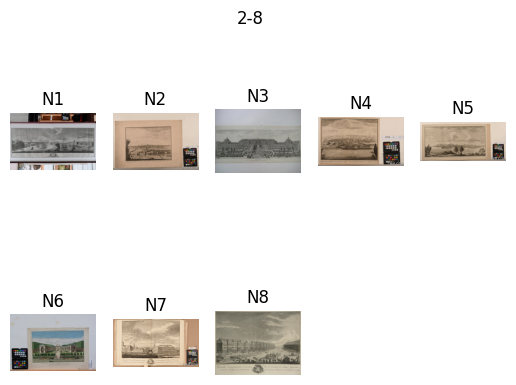

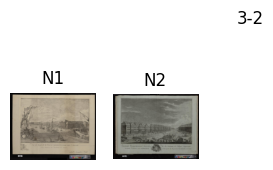

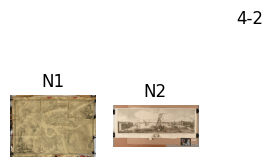

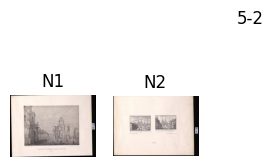

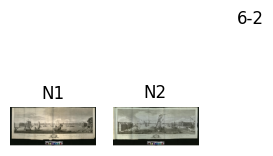

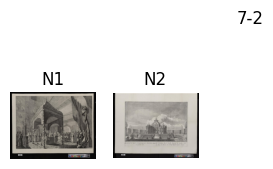

In [141]:
printVizual(data_img_cv2_valid, labels_1_sift, sampel_size = 200, cv2_img = True)

Очевидно, что в отличие от использования тензоров, использование SIFT не выделяет в отдельные кластеры "гравюры на листе" и "гравюры в раме". Однако, хуже различаются сюжеты, объединяясь в более общие кластеры.

### PCA

In [142]:
# %load ./src/functions/get_PCA.py

# Сокращение размерности Метод главных компонент
# Возвращает трансформированный список фечей и объект pca

# X - список фичей,
# components = 2 - размерность до которой сокращаем
def get_PCA(X, components = 2):
    pca = PCA(components)  
    projected = pca.fit_transform(X)
    
    return projected, pca


In [143]:
train_sift_pca, pca = get_PCA(train_sift)

(233, 233)

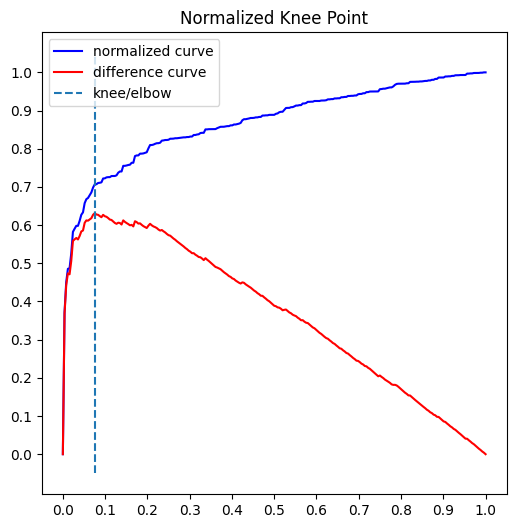

In [144]:
dist0_sift_pca = get_neighbors(train_sift_pca, num = 2)
get_kneeLocatore(dist0_sift_pca, print_plt = True)

In [145]:
labels_knee_sift_pca = get_dbscan_label_test(train_sift_pca, min_samples=2, eps = 0.07)
print_сlustering_param(labels_knee_sift_pca)
print_claster_count(labels_knee_sift_pca)

Количество кластеров : 1. Количество шума: 0 
{0: 253}


In [146]:
best_eps_sift_test =  0.9353
best_sample_sift_test = 2
best_eps_sift_test_clear =  0.93449
best_sample_sift_test_clear = 2

In [147]:
test_rezult_sift = {'Выборка с лучшими значениями метрик на валидационной выборки':get_dbscan_label_test(probs_sift, eps = best_eps_sift, min_samples=best_sample_sift),               
               'Выборка чистая с лучшими значениями метрик на валидационной выборки':get_dbscan_label_test(probs_sift_clear, eps = best_eps_sift, min_samples=best_sample_sift),
               'Выборка с количеством кластеров с лучшими значениями метрик на тесте':get_dbscan_label_test(probs_sift, eps = best_eps_sift_test, min_samples=best_sample_sift_test),               
               'Выборка чистая с количеством кластеров с лучшими значениями метрик на тесте':get_dbscan_label_test(probs_sift_clear, eps = best_eps_sift_test_clear, min_samples=best_sample_sift_test_clear)}

In [148]:
test_rezult = [{
                'title':'с лучшими значениями метрик на валидационной',
                'eps': best_eps_sift,
                'min_samples': best_sample_sift,
                'data_type': 'полная',    
                'labels': get_dbscan_label_test(probs_sift, eps = best_eps_sift, min_samples=best_sample_sift)
               },
               {
                'title':'с лучшими значениями метрик на валидационной',
                'eps': best_eps_sift,
                'min_samples': best_sample_sift,
                'data_type': 'чистая',    
                'labels':get_dbscan_label_test(probs_sift_clear, eps = best_eps_sift, min_samples=best_sample_sift)
               },
               {
                'title':'с лучшими значениями метрик на тесте',
                'eps': best_eps_sift_test,
                'min_samples': best_sample_sift_test,
                'data_type': 'полная',    
                'labels':get_dbscan_label_test(probs_sift, eps = best_eps_sift_test, min_samples=best_sample_sift_test),               
               },
               {
                'title':'с лучшими значениями метрик на тесте',
                'eps': best_eps_sift_test_clear,
                'min_samples': best_sample_sift_test_clear,
                'data_type': 'чистая',    
                'labels':get_dbscan_label_test(probs_sift_clear, eps = best_eps_sift_test_clear, min_samples=best_sample_sift_test_clear),               
               }
              ]

In [149]:
df_table = rezult_DF_DBSCAN(test_rezult)
df_table

,title,data,min_samples,eps,class,counter,noise
0,с лучшими значениями метрик на валидационной,полная,2,0.92800,13,"{0: 1096, -1: 296, 1: 2, 2: 6, 3: 7, 4: 2, 5: ...",296
1,с лучшими значениями метрик на валидационной,чистая,2,0.92800,12,"{-1: 301, 0: 769, 1: 2, 2: 2, 3: 2, 4: 2, 5: 3...",301
2,с лучшими значениями метрик на тесте,полная,2,0.93530,16,"{0: 1269, -1: 122, 1: 2, 2: 2, 3: 2, 4: 2, 5: ...",122
3,с лучшими значениями метрик на тесте,чистая,2,0.93449,15,"{-1: 164, 0: 899, 1: 2, 2: 2, 3: 2, 4: 2, 5: 3...",164


In [150]:
list_test_rezult_sift = []
for k, v in test_rezult_sift.items():
    print(f'{k}')
    count = Counter(v)
    print(f'Количество классов {len(count)}')
    print(count)
    list_test_rezult_sift.append({'title':k, 'labels':v, 'count':dict(count)})

Выборка с лучшими значениями метрик на валидационной выборки
Количество классов 13
Counter({0: 1096, -1: 296, 3: 7, 2: 6, 7: 3, 1: 2, 4: 2, 5: 2, 6: 2, 8: 2, 9: 2, 10: 2, 11: 2})
Выборка чистая с лучшими значениями метрик на валидационной выборки
Количество классов 12
Counter({0: 769, -1: 301, 5: 3, 1: 2, 2: 2, 3: 2, 4: 2, 6: 2, 7: 2, 8: 2, 9: 2, 10: 2})
Выборка с количеством кластеров с лучшими значениями метрик на тесте
Количество классов 16
Counter({0: 1269, -1: 122, 5: 6, 10: 3, 1: 2, 2: 2, 3: 2, 4: 2, 6: 2, 7: 2, 8: 2, 9: 2, 11: 2, 12: 2, 13: 2, 14: 2})
Выборка чистая с количеством кластеров с лучшими значениями метрик на тесте
Количество классов 15
Counter({0: 899, -1: 164, 5: 3, 7: 3, 1: 2, 2: 2, 3: 2, 4: 2, 6: 2, 8: 2, 9: 2, 10: 2, 11: 2, 12: 2, 13: 2})


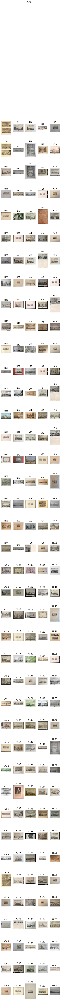

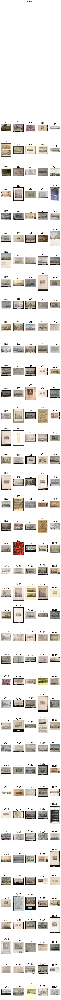

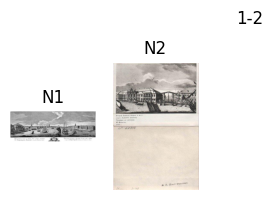

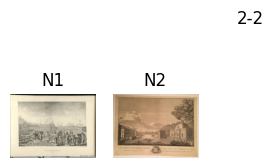

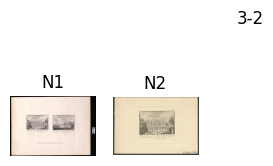

...

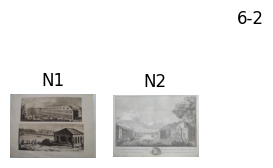

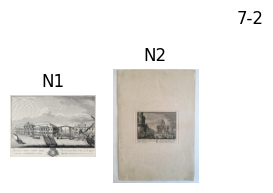

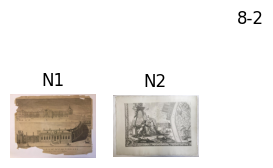

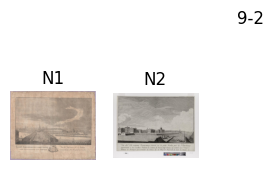

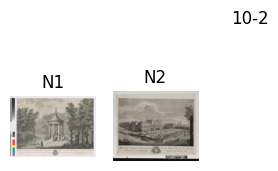

In [151]:
# визуализируем результаты
printVizual(data_img_cv2_clear, list_test_rezult_sift[1]['labels'], suptitle = list_test_rezult_sift[1]['title'], sampel_size = 200, cv2_img = True)

Вывод:
C ключевыми точками DBSCAN не удовлетворительно работает ни с стандартизацией, ни с подбором параметров, ни с сокращением размерности.

## KMeans

### Подбор параметров

In [152]:
# %load ./src/functions/get_KMeans_labels.py

# применяет KMeans с переданными параметрами
# возвращает список полученных лейблов

# X - список фичей,
# k - количество кластеров,
# n_init= 'auto', random_state=1 - параметры KMeans
# scale  -   булево значение стандартизировать или нет перед применение KMeans
# norm  -   булево значение нормализовать или нет перед применение KMeans
# use_centroids = False - использовать переданный массив центройдов
# centroids = '' - центройды
def get_KMeans_labels(X, k, scale = True, norm = True, use_centroids = False, centroids = '', n_init= 'auto', random_state=1):
    if use_centroids:
       # если передаем центройды
       kmeans = KMeans(n_clusters=max(2, len(centroids)), init=centroids, n_init=1, random_state=random_state)
    else:
       kmeans = KMeans(n_clusters=max(k,2), n_init=n_init, random_state=random_state)
    if scale:
       scaler = StandardScaler()
       X = scaler.fit_transform(X)
    if norm:
       X = normalize(X)
    kmeans.fit(X)
    return kmeans.labels_


In [153]:
# %load ./src/functions/get_klasters_set.py

# нахождение оптимального количества кластеров для KMeans,
# методом силуэта
# возвращает средние значение силуэта для выбранного количества кластеров

# X - список фичей,
# num = 10 -  параметр KMeans, количество примененеий метода для рассчета среднего значения силуэта,
# scale  -   булево значение стандартизировать или нет перед применение KMeans
# norm  -   булево значение нормализовать или нет перед применение KMeans

def get_KMeans_silhouette_score(X, k, num = 10, scale = True, norm = True):
    kmeans = KMeans(n_clusters=max(k,2), n_init= 'auto', random_state=num)
    if scale:
       scaler = StandardScaler()
       X = scaler.fit_transform(X)
    if norm:
       X = normalize(X)
    kmeans.fit(X)
    cluster_labels = kmeans.labels_
    silhouette_avg = silhouette_score(X, cluster_labels)

    return silhouette_avg

# рассчитывает значение силуэта для различных k в заданном диапазоне
# возвращаем словарь вида {количество кластеров:значение силуэта}

# X - список фичей,
# start = 10, end = 110, step_list = [10, 5, 1] - диапазон в которых проверяме значения k и шаг с которым выполняем проверку
# set_len = 3 - размер возвращаемого словаря
# scale  -   булево значение стандартизировать или нет перед применение KMeans
# norm  -   булево значение нормализовать или нет перед применение KMeans
def get_klasters_set(X, start = 10, end = 110, step_list = [10, 5, 1], set_len = 3, scale = True, norm = True):
    current_start = start
    current_end = end
    for step in step_list:
        # считаем для каждого k значение силуэта        
        k_dict = {max(k, 2): get_KMeans_silhouette_score(X, k, scale = scale, norm = norm) for k in range(current_start, current_end, step)}
        # сортируем результаты по значениям силуэта
        k_dict = dict(sorted(k_dict.items(), key=lambda item: item[1], reverse = True))

        # print(k_dict)
        # берем два k с самыми высокими значениями и сортируем их по возрастанию k
        # таким образом получаем новые значения current_start и current_end
        param = sorted(list(k_dict.items())[0:2])
        current_start, current_end = param[0][0], param[1][0] + 1

    # берем первые значения из списка (по умолчанию - 3)
    rezult = list(k_dict.items())[0:set_len]
    # получем список кластеров
    #return [i[0] for i in rezult]
    return rezult


In [154]:
def metricsRezult_forDF(metric_list):
    rezult_dict = {}
    
    for item in metric_list:       
        if isinstance(item['score'], tuple):
              score_title_list = item['score_name'].split(',')
              for i in range(len(item['score'])):
                  rezult_dict[score_title_list[i]] = item['score'][i]
        else:
            rezult_dict[item['score_name']]=item['score']
    return rezult_dict  

In [155]:
def rezult_DF(klaster_dict_list, X, y, num = 10, scale = True, norm = True, title_list = [], silhouet = True):
    rezult_list = []
    for klaster_dict in klaster_dict_list:
      for k, v in klaster_dict.items():
          row_dict = {}

          row_dict.update({'class':k, 'counter':dict(Counter(v))})
          if silhouet:
             row_dict['silhouette_score'] = get_KMeans_silhouette_score(X, k, num = num, scale = scale, norm = norm)
          current_metric_list = getMetricsRezult(v, y, global_score_funcs)
          row_dict.update(metricsRezult_forDF(current_metric_list))

          rezult_list.append(row_dict)
    df_rezult = pd.DataFrame(rezult_list)
    if len(title_list) != 0:
       df_rezult.insert(0, 'title', title_list)


    return df_rezult

In [156]:
# не нашла более разумного способа, поэтому отдельно считаем возможное количество кластеров от 2 до 10 и от 10 до 100 
k_dict_sift = get_klasters_set(train_sift) + get_klasters_set(train_sift, start = 0, end = 10, step_list = [1])
k_list_sift = [i[0] for i in k_dict_sift]
k_list_sift.append(len(plots_in_valid_table_df))
k_list_sift

[33, 32, 30, 2, 3, 5, 70]

In [157]:
labels_dict_sift = dict(zip(k_list_sift, [get_KMeans_labels(train_sift, k) for k in k_list_sift]))

In [158]:
df_table = rezult_DF([labels_dict_sift], X = train_sift, y = labels_sift_true)
df_table

,class,counter,silhouette_score,Rand index,ARI,AMI,Однородность,Полнота,V-мера
0,33,"{3: 22, 27: 21, 10: 22, 32: 8, 24: 8, 21: 8, 3...",0.002491,0.937135,0.022546,0.057349,0.490847,0.565578,0.525569
1,32,"{3: 22, 27: 21, 10: 22, 6: 8, 24: 8, 21: 8, 30...",0.002280,0.936257,0.020642,0.052089,0.482134,0.560237,0.518260
2,30,"{3: 23, 27: 21, 10: 24, 6: 10, 24: 8, 21: 8, 1...",0.002248,0.934030,0.028515,0.060849,0.472284,0.560036,0.512430
3,2,"{0: 97, 1: 156}",0.009749,0.478637,0.004949,0.031821,0.062435,0.358542,0.106351
4,3,"{0: 78, 2: 71, 1: 104}",0.005711,0.653366,0.006083,0.032714,0.101204,0.356643,0.157667
5,5,"{4: 63, 1: 67, 0: 47, 2: 39, 3: 37}",0.004572,0.780287,0.020523,0.055397,0.173561,0.419900,0.245604
6,70,"{2: 20, 5: 7, 47: 3, 27: 5, 22: 5, 24: 3, 42: ...",0.000941,0.954953,0.025109,0.052007,0.643154,0.614567,0.628535


In [159]:
best_score_k_sift = k_list_sift[0]

temp_dict = {
             best_score_k_sift: labels_dict_sift[best_score_k_sift], 
             len(plots_in_valid_table_df): labels_dict_sift[len(plots_in_valid_table_df)]
            }
temp_title_list = [
    'С лучшими показателями метрики',
    'C кластерами = количеству сюжетов'
]
df_table = rezult_DF([temp_dict], X = train_sift, y = labels_sift_true,  title_list = temp_title_list)
df_table

,title,class,counter,silhouette_score,Rand index,ARI,AMI,Однородность,Полнота,V-мера
0,С лучшими показателями метрики,33,"{3: 22, 27: 21, 10: 22, 32: 8, 24: 8, 21: 8, 3...",0.002491,0.937135,0.022546,0.057349,0.490847,0.565578,0.525569
1,C кластерами = количеству сюжетов,70,"{2: 20, 5: 7, 47: 3, 27: 5, 22: 5, 24: 3, 42: ...",0.000941,0.954953,0.025109,0.052007,0.643154,0.614567,0.628535


Выводы 
- с ключевыми точками Kmeans не определяет хорошо количество кластеров в выборке

##### Центройды

In [160]:
centroids_sift = pd.DataFrame(list(data_key_img_cv2['features'])).to_numpy()

In [161]:
data_key_img_cv2_short = data_key_img_cv2.loc[data_key_img_cv2['plot_id'].isin(plots_in_valid_table_df)]
centroids_sift_short = pd.DataFrame(list(data_key_img_cv2_short['features'])).to_numpy()
labels_with_centroids_sift_short = get_KMeans_labels(X = train_sift, k = len(centroids_sift_short), use_centroids = True, centroids=centroids_sift_short)

In [162]:
temp_dict = [{
             len(centroids_sift_short): labels_with_centroids_sift_short
            },
            {
                len(plots_in_valid_table_df): labels_dict_sift[len(plots_in_valid_table_df)]
            },
            {
                best_score_k_sift: labels_dict_sift[best_score_k_sift]
            }
]
temp_title_list = [
    'C центройдами',
    'То же количество кластеров, без центройдов',
    'С лучшими показателями метрики без центройдов'
]
df_table = rezult_DF(temp_dict, X = train_sift, y = labels_sift_true,  title_list = temp_title_list)
df_table

,title,class,counter,silhouette_score,Rand index,ARI,AMI,Однородность,Полнота,V-мера
0,C центройдами,70,"{53: 184, 2: 1, 3: 1, 4: 1, 8: 1, 9: 1, 10: 1,...",0.000941,0.475500,0.004040,0.012489,0.291882,0.641018,0.401118
1,"То же количество кластеров, без центройдов",70,"{2: 20, 5: 7, 47: 3, 27: 5, 22: 5, 24: 3, 42: ...",0.000941,0.954953,0.025109,0.052007,0.643154,0.614567,0.628535
2,С лучшими показателями метрики без центройдов,33,"{3: 22, 27: 21, 10: 22, 32: 8, 24: 8, 21: 8, 3...",0.002491,0.937135,0.022546,0.057349,0.490847,0.565578,0.525569


In [163]:
# сравниваем на том же количестве классов, но без установленных центройдов
print(f'Количество классов {len(centroids_sift_short)} с установленными центройдами')
print(dict(Counter(labels_with_centroids_sift_short)))


print(f'Количество классов {len(plots_in_valid_table_df)} без центройдов')
print(dict(Counter(labels_dict_sift[len(plots_in_valid_table_df)])))

Количество классов 70 с установленными центройдами
{53: 184, 2: 1, 3: 1, 4: 1, 8: 1, 9: 1, 10: 1, 12: 1, 14: 1, 15: 1, 18: 1, 19: 1, 21: 1, 27: 1, 25: 1, 30: 1, 31: 1, 35: 1, 38: 1, 40: 1, 67: 1, 62: 1, 42: 1, 48: 1, 51: 1, 52: 1, 54: 1, 69: 1, 56: 1, 57: 1, 46: 1, 43: 1, 41: 1, 66: 1, 39: 1, 36: 1, 32: 1, 26: 1, 23: 1, 68: 1, 20: 1, 17: 1, 11: 1, 7: 1, 50: 1, 44: 1, 60: 1, 1: 1, 64: 1, 16: 1, 63: 1, 47: 1, 55: 1, 59: 1, 58: 1, 49: 1, 24: 1, 45: 1, 37: 1, 34: 1, 33: 1, 61: 1, 29: 1, 28: 1, 22: 1, 65: 1, 13: 1, 6: 1, 5: 1, 0: 1}
Количество классов 70 без центройдов
{2: 20, 5: 7, 47: 3, 27: 5, 22: 5, 24: 3, 42: 9, 7: 3, 60: 3, 41: 1, 6: 12, 14: 8, 63: 9, 36: 1, 15: 3, 4: 3, 57: 3, 49: 3, 3: 2, 23: 4, 0: 2, 46: 4, 8: 7, 58: 2, 13: 5, 52: 4, 56: 2, 1: 3, 17: 3, 43: 3, 31: 4, 26: 3, 20: 3, 19: 7, 51: 3, 65: 2, 10: 3, 55: 12, 16: 3, 32: 3, 21: 4, 38: 2, 12: 4, 40: 2, 34: 4, 64: 2, 9: 2, 48: 2, 28: 2, 30: 3, 53: 3, 29: 2, 37: 2, 62: 2, 59: 3, 45: 1, 50: 3, 25: 3, 33: 2, 61: 1, 68: 1, 39: 2, 1

/tmp/ipykernel_691697/2771171507.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(6.4, 2.4*row))


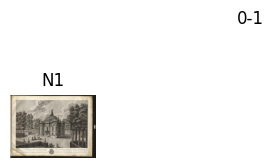

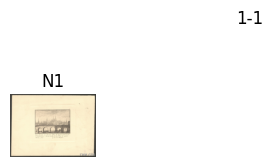

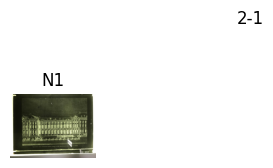

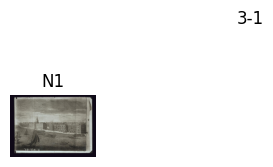

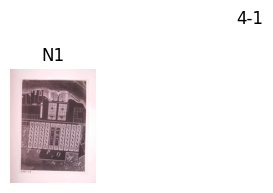

...

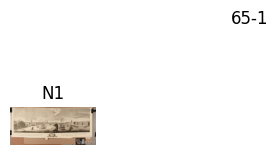

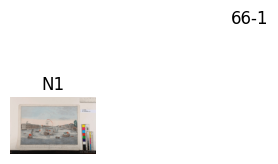

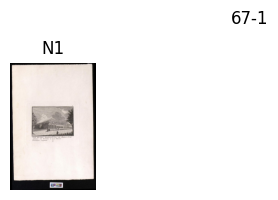

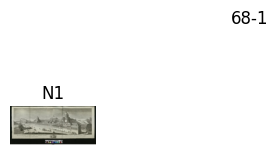

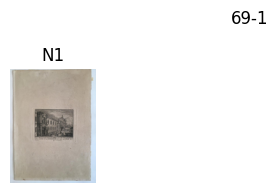

In [164]:
printVizual(data_img_cv2_valid, labels_with_centroids_sift_short, suptitle = 'С установленными центройдами', sampel_size = 200, cv2_img = True)

С ключевыми точками очевидно не имеет смысла применять центройды, т.к. каждый класс оказывается равен только центройду, остальные попадают в один кластер.

### На тесте

In [165]:
def rezult_DF_test(klaster_list, num = 10, scale = True, norm = True):
    rezult_list = []
    
    for item in klaster_list:
        row_dict = {}     
        count = dict(Counter(item['labels']))
        X = item['data']
        row_dict.update({'title':item['title'],'class':len(count), 'data':item['data_type'],'counter':count})
        row_dict['silhouette_score'] = get_KMeans_silhouette_score(X, len(count), num = num, scale = scale, norm = norm)
                        
        rezult_list.append(row_dict)      
    
    return pd.DataFrame(rezult_list)

In [166]:
# найдем лучшее значение силуэта для полной выборке
k_dict_sift_test = get_klasters_set(probs_sift) + get_klasters_set(probs_sift, start = 0, end = 10, step_list = [1])
k_list_sift_test = [i[0] for i in k_dict_sift_test]

best_score_k_sift_test = k_list_sift_test[0]

k_dict_sift_test_clear = get_klasters_set(probs_sift_clear) + get_klasters_set(probs_sift_clear, start = 0, end = 10, step_list = [1])
k_list_sift_test_clear = [i[0] for i in k_dict_sift_test_clear]


best_score_k_sift_test_clear = k_list_sift_test_clear[0]

In [167]:
labels_dict_sift_test_clear = dict(zip(k_list_sift_test_clear, [get_KMeans_labels(probs_sift_clear, k) for k in k_list_sift_test_clear]))

In [168]:
test_rezult = [{
                'title':'C центройдами',
                'data': probs_sift,
                'data_type': 'полная',
                'labels': get_KMeans_labels(X = probs_sift, k = len(centroids_sift), use_centroids = True, centroids=centroids_sift)                
               },
               {
                'title':'C количеством кластеров = числу сюжетов',
                'data': probs_sift,
                'data_type': 'полная',
                'labels': get_KMeans_labels(X = probs_sift, k = len(data_key_img_cv2))
               },
               {
                'title':'C количеством кластеров = лучшими значениями метрик на валидационной выборке',
                'data': probs_sift,
                'data_type': 'полная',
                'labels': get_KMeans_labels(X = probs_sift, k = best_score_k_sift)
               },
               {
                'title':'C лучшими значениями силуэта на тесте',
                'data': probs_sift,
                'data_type': 'полная',
                'labels': get_KMeans_labels(X = probs_sift, k = best_score_k_sift_test)
               },
               {
                'title':'Выборка чистая с центройдами',
                'data': probs_sift_clear,
                'data_type': 'чистая',
                'labels': get_KMeans_labels(X = probs_sift_clear, k = len(centroids_sift), use_centroids = True, centroids=centroids_sift)
               },
               {
                'title':'Выборка чистая количеством кластеров = сюжетов',
                'data': probs_sift_clear,
                'data_type': 'чистая',
                'labels': get_KMeans_labels(X = probs_sift_clear, k = len(data_key_img_cv2))
               },
               {
                'title':'Выборка чистая с количеством кластеров с лучшими значениями метрик на валидационной выборке',
                'data': probs_sift_clear,
                'data_type': 'чистая',
                'labels': get_KMeans_labels(X = probs_sift_clear, k = best_score_k_sift)
               },
               {
                'title':'Выборка чистая с лучшими значениями силуэта на тесте',
                'data': probs_sift_clear,
                'data_type': 'чистая',
                'labels': get_KMeans_labels(X = probs_sift_clear, k = best_score_k_sift_test_clear)
               }
              ]

In [169]:
df_table = rezult_DF_test(test_rezult)
df_table

,title,class,data,counter,silhouette_score
0,C центройдами,95,полная,"{74: 1330, 38: 1, 8: 1, 70: 1, 10: 1, 32: 1, 3...",0.007649
1,C количеством кластеров = числу сюжетов,95,полная,"{57: 12, 47: 26, 65: 5, 67: 38, 40: 173, 77: 7...",0.007649
2,C количеством кластеров = лучшими значениями м...,33,полная,"{12: 59, 18: 31, 19: 34, 32: 144, 3: 35, 29: 1...",0.005964
3,C лучшими значениями силуэта на тесте,61,полная,"{57: 18, 47: 35, 40: 192, 48: 98, 31: 53, 24: ...",0.008894
4,Выборка чистая с центройдами,95,чистая,"{74: 997, 4: 1, 10: 1, 12: 1, 15: 1, 22: 1, 23...",-0.000739
5,Выборка чистая количеством кластеров = сюжетов,95,чистая,"{21: 18, 60: 7, 4: 135, 38: 68, 64: 8, 44: 5, ...",-0.000739
6,Выборка чистая с количеством кластеров с лучши...,33,чистая,"{14: 24, 32: 133, 16: 107, 31: 17, 19: 24, 17:...",0.000701
7,Выборка чистая с лучшими значениями силуэта на...,12,чистая,"{10: 84, 4: 163, 5: 108, 9: 89, 7: 161, 6: 88,...",0.002717


In [170]:
i = 0
for item in test_rezult:
    print(f"{i}. {item['title']}")
    count = Counter(item['labels'])    
    print(count)
    i+=1

0. C центройдами
Counter({74: 1330, 38: 1, 8: 1, 70: 1, 10: 1, 32: 1, 31: 1, 50: 1, 79: 1, 93: 1, 29: 1, 48: 1, 28: 1, 53: 1, 58: 1, 66: 1, 59: 1, 57: 1, 25: 1, 23: 1, 47: 1, 85: 1, 44: 1, 43: 1, 35: 1, 20: 1, 17: 1, 16: 1, 15: 1, 14: 1, 68: 1, 13: 1, 12: 1, 83: 1, 45: 1, 11: 1, 90: 1, 4: 1, 3: 1, 41: 1, 82: 1, 39: 1, 2: 1, 34: 1, 1: 1, 0: 1, 73: 1, 52: 1, 5: 1, 75: 1, 91: 1, 6: 1, 7: 1, 9: 1, 76: 1, 54: 1, 40: 1, 77: 1, 86: 1, 81: 1, 37: 1, 30: 1, 88: 1, 21: 1, 46: 1, 87: 1, 65: 1, 22: 1, 51: 1, 24: 1, 55: 1, 56: 1, 72: 1, 69: 1, 26: 1, 60: 1, 27: 1, 62: 1, 61: 1, 67: 1, 78: 1, 84: 1, 18: 1, 49: 1, 64: 1, 42: 1, 80: 1, 89: 1, 36: 1, 92: 1, 63: 1, 33: 1, 71: 1, 94: 1, 19: 1})
1. C количеством кластеров = числу сюжетов
Counter({40: 173, 1: 90, 77: 75, 48: 52, 85: 39, 67: 38, 2: 38, 93: 36, 63: 36, 47: 26, 89: 26, 49: 23, 91: 22, 35: 21, 31: 19, 61: 19, 53: 19, 43: 18, 19: 17, 32: 17, 16: 16, 26: 16, 72: 16, 3: 15, 13: 15, 37: 15, 76: 14, 68: 14, 45: 14, 29: 13, 12: 13, 64: 13, 57: 12, 2